# TIL6022 Programming Group 28

Members and student numbers:
- Hugo Mann (4729153)
- Max Scholten (4880684)
- Koen van Maanen (4855086)
- Maxime van Berkum (4963377)
- Joost van Maanen (4961757)    

# 1. Introduction

### 1.1 Intro

In the last few weeks, we carried out research into the delays in the dutch railway infrastructure. In 2021, on average there were more than 600.000 travelers by train in the Netherlands. People go to work on a daily basis, they visit family and friends or travel for other purposes. Delays can result in lots of waste of time, which can be used in a way more effective way. In this assignment, we investigated on which tracks the most delays occur, which stations most affected by those delays, and what reasons causing those delays. 

We are all students of the University of Technology in Delft. Some of us do not live in Delft, so they have to travel by train to the campus multiple times a week. Besides that, we all like to visit our family often, but also in this case we have to travel by train to see them. In those situations, we too often have to deal with delays. When you’re traveling to campus, and you miss a lecture or, even worse, an exam by a canceled train, this irritates you a lot. This motivates us to look up into this problem and see if we can find a (partly) solution to this problem.


### 1.2 Research objective

As explained, the main problem when using the train is that it often doesn't go as planned. Trains you were planning to use are often delayed, which may cause missing your transfer, or are completely canceled. The many changes of train departure times and the people who are affected by it brings us to the following main research question: 

*‘By what disruptions and on what train trajectories are the most people affected, and how can the impact of these postponements be minimized?’*

To answer the main question we’ve separated it into sub-questions: 
1. *What are the main causes of the delay for the train?*
2. *Which train routes have the most delays/cancellations?*
3. *By which cancellations are most passengers affected?*

The sub questions will be answered by performing a data research. 


### 1.3 Contribution statement


The contribution per group member:

- **Hugo Mann:** coding, background research, conceptualisation, data analysis, data modelling
- **Max Scholten:** coding, background research, conceptualisation, visualisation, data modelling
- **Koen van Maanen:** coding, background research, conceptualisation, data analysis, data modelling
- **Maxime van Berkum:** coding, background research,  visualisation, data analysis, data modelling
- **Joost van Maanen:** coding, background research, conceptualisation, data analysis, data modelling

# 2. Data story

### 2.1 Data import 

#### 2.1.1 Import libraries

In [1]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import random
from pathlib import Path
import datetime
from urllib.request import urlopen
from plotly.offline import init_notebook_mode
import plotly.express as px
import plotly.graph_objects as go
import json
import itertools
import matplotlib.animation as animation
import plotly.io as pio
import geopandas as gpd
import math
import shapely.geometry

#### 2.1.2 Train disruptions

To determine the amount of train delays and corresponding location, a dataset was needed where all the different delays were tracked with the corresponding starting- and end-points. This data would help with getting an insight in where most delays occur and what the main causes are.

After some research the dataset disruptions-2021.csv was found. This dataset contains 40499 rows of data describing one year of train disruptions in the Netherlands. 
Each row describes the following: 
- **rdt_id**: the ID that Rijden de Treinen uses for a disruption.
- **ns_lines**: the trajectory that the NS links to a disruption, but not standardized.
- **rdt_lines**: the trajectories linked to a disruption by Rijden de Treinen, in alphabetical order.
- **rdt_lines_id**: the ID of the trajectories that Rijden de Treinen has linked.
- **rdt_station_names**: the stations that have been impacted by the disruption.
- **rdt_station_codes**: the abbreviations of the stations involved with the disruption.
- **cause_nl**: the cause of the disruption in Dutch, if the cause of disruption is changed during the disruption the final used cause is shown.
- **cause_en**: disruption cause in English.
- **statistical_cause_nl**: Rijden de Treinen has kept a list of the information of the original disruption as in some cases this gets lost. For example, if the cause changes to “an earlier disruption” the original cause is shown in this column.
- **statistical_cause_en**: statistical cause in English.
- **cause_group**: the group a disruption belongs to .
- **start_time**: date and at what time the disruption started.
- **end_time**: date and at what time the disruption ended.
- **duration_minutes**: disruption time in minutes.

The following code removes the columns that are of no use for the analysis of the data:

In [2]:
file = 'disruptions-2021.csv'
data = pd.read_csv(file)
data
data2 = data.drop(columns=['ns_lines', 'rdt_lines_id','cause_nl','cause_en','statistical_cause_nl','start_time','end_time'])
data2.head()

,rdt_id,rdt_lines,rdt_station_names,rdt_station_codes,statistical_cause_en,cause_group,duration_minutes
0,35626,"Berlin Ostbahnhof - Hengelo, Bielefeld Hbf - H...","Hengelo,Hengelo Oost,Oldenzaal","HGL, HGLO, ODZ",broken down train,rolling stock,197.0
1,35627,"Amersfoort - Amsterdam Centraal, Amsterdam Cen...","Amsterdam Centraal,Amsterdam Muiderpoort,Amste...","ASD, ASDM, ASSP, DMN, WP",broken down train,rolling stock,12.0
2,35628,Baarn - Utrecht Centraal,"Baarn,Den Dolder,Soestdijk,Soest,Soest Zuid","BRN, DLD, SD, ST, STZ",damaged overhead wires,infrastructure,421.0
3,35629,Emmen - Zwolle,"Gramsbergen,Hardenberg,Mariënberg","GBG, HDB, MRB",broken down train,rolling stock,20.0
4,35630,Roosendaal - Vlissingen,"Bergen op Zoom,Rilland-Bath","BGN, RB",collision,accidents,42.0


#### 2.1.3 Occupancy rate

To determine the amount of people that travel over a certain track, a data set was needed with this information. After searching on the internet this information could not be found, because tracking people on their train journey is not allowed due to privacy. The information that could be found entails the occupancy rate of each train. This occupancy rate is an estimated guess made by NS to determine how busy each train is. This information is shown in the NS-app to show users the busyness of their train. This information was gathered by contacting an active user on the NS community forum (Henk_NL). The conversation with this user is shown in the appendix. This occupancy rate has an index from 1 to 5. The table below shows what each occupancy rate means.

In [3]:
OccupancyRateTable = pd.DataFrame({
    'Occupancy rate':[1,2,3,4,5],
    'Meaning':['Empty','Many seats available','Few seats available','Standing room only','Full'],
    'Occupancy percentage':['0% seats occupied','<65% seats occupied','>65% and <100% seats occupied','>100% seats occupied','100% seats and 100% standing room occupied']
    })
OccupancyRateTable

,Occupancy rate,Meaning,Occupancy percentage
0,1,Empty,0% seats occupied
1,2,Many seats available,<65% seats occupied
2,3,Few seats available,>65% and <100% seats occupied
3,4,Standing room only,>100% seats occupied
4,5,Full,100% seats and 100% standing room occupied


The number 1 does not actually occur in the dataset, because an empty train means there are many seats available. In a way the number 1 represents the same as number 2, so these two values can be combined. Number 5 also does not occur in the dataset. This value is only relevant for real-time data, because if the expected occupancy of a train is ‘full’ the capacity will be enlarged. This results in three different values for the occupancy rate and these can be found in the dataset.

### 2.2 Data processing 

#### 2.2.1 Stations and tracks locations

##### Stations

In [4]:
# Loading in the stations dataset
stations_set = "stations-2022-01-nl.csv"
stations = pd.read_csv(stations_set, delimiter=',')
stations.set_index('id', inplace=True)
stations = stations.sort_values('id')
stations.head()

,code,uic,name_short,name_medium,name_long,slug,country,type,geo_lat,geo_lng
id,,,,,,,,,,
5,AC,8400047,Abcoude,Abcoude,Abcoude,abcoude,NL,stoptreinstation,52.278500,4.977000
6,AH,8400071,Arnhem C,Arnhem C.,Arnhem Centraal,arnhem-centraal,NL,knooppuntIntercitystation,51.985001,5.899167
9,AHP,8400072,Velperprt,Velperpoort,Arnhem Velperpoort,arnhem-velperpoort,NL,stoptreinstation,51.985279,5.919445
10,AHPR,8400075,Presikhaaf,Presikhaaf,Arnhem Presikhaaf,arnhem-presikhaaf,NL,stoptreinstation,51.988056,5.943889
11,AHZ,8400227,Arnhem Z,Arnhem Z.,Arnhem Zuid,arnhem-zuid,NL,stoptreinstation,51.955002,5.851944


In [5]:
# Loading in the .json file from Henk_NL
file_path = 'henk_data.json'
with open(file_path, 'r') as fp:
    data = json.load(fp)
print('data is of type ', type(data))

data is of type  <class 'dict'>


In [6]:
data['Stations'][1]['Data'][1]['Value'] # Amount of travellers for the second station in the list
data['Stations'][1]['Alias']

data['Stations']

boarding_data=[]

for i in range(len(data['Stations'])):
    a = data['Stations'][i]['Alias']
    b = data['Stations'][i]['Data'][1]['Value']
    boarding_data.append([a,b])

# Data of stations not exploited by NS not known in this dataset, assigned value None
nones = 0
for i in boarding_data:
    if i[1] == None:
        nones += 1
print("stations: %i, nones: %i" % (len(stations), nones))    

stations: 397, nones: 158


In [7]:
# Create column
stations['BoardingDeboarding'] = 0
stations['Maatschappij'] = None

for s in stations.index:
    for b in boarding_data:    
        if stations.code[s] == b[0]:
            stations['BoardingDeboarding'][s] = b[1]
            if b[1] != None:
                stations['Maatschappij'][s] = 'NS'
            else: 
                stations['Maatschappij'][s] = 'Other (no data)'
    
stations['BoardingDeboarding'] = stations['BoardingDeboarding'].fillna(0)

# Create extra colmn for scaled data
stations["BDB_Filtered"] = 0

# Scale data with sqrt
for i in stations.index:
    stations["BDB_Filtered"][i] = 20 + math.sqrt(stations['BoardingDeboarding'][i])

C:\Users\joost\AppData\Local\Temp\ipykernel_1712\3633873492.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\joost\AppData\Local\Temp\ipykernel_1712\3633873492.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\joost\AppData\Local\Temp\ipykernel_1712\3633873492.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\joost\AppData\Local\Temp\ipykernel_1712\3633873492.py:21: SettingWithCopyWarning:


A value 

##### Tracks

In [8]:
# Loading the .json file with data of the tracks
file_path = 'trajecten.json'
with open(file_path, 'r') as fp:
    trace = json.load(fp)
print('data is of type ', type(trace))

data is of type  <class 'dict'>


Some pieces of track (segments) are in the data set twice. These doubles are filtered out by using the geo_code, which is unique for a segment but not for the measurement (so when a segment is updated, the geocode remains the same).

In [9]:
features = trace['features']

geocodes = []
doubles = {}      
# Before running the code we didn't know if segments could be in the set more than twice, so we kept track of the number of doubles per segment (which turned out to be one for all segments).


for i in range(len(features)):
    feature = features[i]
    properties = feature['properties']
    geosubcode = properties['geosubcode']
    
    if geosubcode not in geocodes:
        geocodes.append(geosubcode)
    elif geosubcode not in doubles:
        doubles[geosubcode] = 1
    else:
        doubles[geosubcode] += 1

geocodes.sort()

print('number of unique segments: %i' % len(geocodes))
print('number of double segments: %i' % len(doubles))

number of unique segments: 610
number of double segments: 390


In [10]:
# Here the doubles were actually filtered out
features2 = []
geocodes = []

for i in range(len(features)):
    feature = features[i]
    properties = feature['properties']
    geosubcode = properties['geosubcode']
    
    if geosubcode not in geocodes:
        geocodes.append(geosubcode)
        features2.append(feature)

The set contained al train tracks in NL, so also for industry and trade. These needed to be removed. While civil (segements of) tracks mostly have names containing the towns or areas they pass, these non-civil tracks have names containing words like 'Industry', 'Port', 'Raccordement', 'Terrain' etc. (but then in Dutch). (hence the 'words'list) After that we plotted the set (using px.line_mapbox, which turned out to not be suitable for out actual application of the data but was OK for this purpose) and collected the geocodes of the remaining non civil tracks (hence the list 'codes_to_remove').

In [11]:
words = ['Industrieterrein', 'Zeehaventerrein', 'haven', 'industrie', 'Racc.', 'fabriek', 'Raccordement', 'terrein', 'gebied', 'Hoofdwerkplaats', 'Gent', 'Sas van Gent', 'Terneuzen', 'Axel', 'Roosendaal Borchwerf', 'Roosendaal Majoppeveld', 'Moerdijk Industrieterrein', 'Dordrecht Industrieterrein', 'Zeehaven Industrieterrein', 'Zwijndrecht Groote Lindt', 'Waalhaven Zuid', 'Rotterdam Waalhaven', 'Rotterdam eemhaven', 'Pernis', 'Botlek', 'Rotterdam Europoort', 'Maasvlakte 2', 'Maasvlakte', 'Barendrecht Vork, Rotterdam Maasvlakte', 'Rotterdam Maasvlakte', 'Leidschendam Lijnwerkplaats', 'Leidschenhaven', 'Amsterdam Houtrakpolder', 'Beverwijk Hoogovens', 'Tilburg de', 'Oosterhout Weststad', 'Boxtel - Uden', 'Venlo Tradeport', 'Born', 'Arnhem Gem. Stamlijn', 'Stamlijn', 'Arnhem Goederenstation', 'Antwerpen Noorderdokken', 'Lage Zwaluwe - Hooge Zwaluwe', 'Hooge', 'Nievelsteenstraat', 'Musselkanaal', 'Betuweroute']

# Some of the tracks are not used for public transport, these are filtered out in the code below
codes_to_remove = ['152_a', '152_b', '924_a', '924_b', '116_b', '666_c', '666_d', '666_e', '938__', '512_b', '512_c', '512_d', '158__', '611_c', '565_a', '565_b', '110__', '081_', '844_a', '844_b', '288_', '775__', '776__', '451_a', '451_b', '777_', '778__', '779__', '039__', '507_a', '507_b', '048__', '056__', '780__', '061__', '781_a', '781_b', '782__', '066_b', '783__', '068__', '784__', '785__', '072_a', '072_b', '520_c', '786__', '058__', '788__', '126_a', '120_b', '081__', '054_b', '054_c', '667_a', '667_b', '787__', '228__', '167__', '121_c', '155_a', '155_b', '666_b', '164__', '121_b', '625_c', '119_b', '165__', '116_c', '663_b', '663_c', '663_d', '663_g', '777__']

removed_ids = []

i = 0

print('---REMOVED---')
while i < len(features2):
    feature = features2[i]
    name = feature['properties']['geocode_naam']
    ID = feature['properties']['objectid']
    code = feature['properties']['geosubcode']
    removed = False
    
    if ID == 569 or code == '161__':  # Two tracks had 'industrie' in the name, so these will be left in this way
        i += 1
        continue
    
    for word in words:
        if word in name:
            features2.remove(feature)
            removed_ids.append(ID)
            removed = True
            print('-----------\nName: %s\n  ID: %i' % (name, ID))
            break
    
    if code in codes_to_remove and not removed:
        features2.remove(feature)
        removed_ids.append(ID)
        removed = True
        print('-----------\nName: %s\n  ID: %i' % (name, ID))
            
    if not removed:
        i += 1
        
print(len(removed_ids))

---REMOVED---
-----------
Name: Maasvlakte 2
  ID: 1
-----------
Name: Rotterdam Maasvlakte
  ID: 2
-----------
Name: Vlissingen Sloehaven
  ID: 5
-----------
Name: Amsterdam Houtrakpolder (gebied)
  ID: 6
-----------
Name: Botlek
  ID: 7
-----------
Name: Utrecht Industrieterrein Lage Weide
  ID: 11
-----------
Name: Almelo Gem. Stamlijn
  ID: 12
-----------
Name: Maastricht - Maastricht Grens
  ID: 14
-----------
Name: Pernis
  ID: 16
-----------
Name: Maastricht
  ID: 24
-----------
Name: Botlek
  ID: 26
-----------
Name: Lage Zwaluwe
  ID: 27
-----------
Name: Maastricht Racc. Beatrixhaven
  ID: 28
-----------
Name: Kijfhoek - Meteren Aansl.
  ID: 29
-----------
Name: Herzogenrath (D)
  ID: 31
-----------
Name: Kijfhoek - Moerdijkbrug
  ID: 33
-----------
Name: Dordrecht Zeehaventerrein
  ID: 34
-----------
Name: Amsterdam Hemhaven (gebied)
  ID: 35
-----------
Name: Tiel Gem. Stamlijn
  ID: 36
-----------
Name: Schiedam Centrum - Vlaardingen Vulcaanhaven
  ID: 40
-----------
Name:

#### 2.2.2 Data selecting and preparing

The given data that shows the occupancy rate is divided in datasets per 10 days. Each day a new dataset is released with the predicted occupancy rate for the next 10 days. To make good comparisons with other datasets only one day of the week has been chosen. This will also be the busiest day of the week: Tuesday. And to make the calculations more valid and not dependent on one season, all Tuesdays of the year 2021 have been selected. To get this specific selection the code below has been used. For this each week's dataset has been downloaded, starting the week on Tuesday. Because these datasets are for the next 10 days only the first 7 days are needed. After removing the extra days these datasets can be combined to one .csv file with the predictions of every day of 2021.

In [12]:
# Opening the location with all the datasets and creating a list for all the dataframes
path = "C:/Users/joost/Downloads/Finalreport/Alldays"  
file = Path(path).glob('*')
df_list = []

# Looping through each dataset and selecting the first 7 days, the remaining days will be removed
for i in file:
    df = pd.read_csv(i)

    firstday = df["OperatingDay"].min()
    start_date = datetime.datetime.strptime(firstday, "%Y-%m-%d")
    end_date = start_date + datetime.timedelta(days=7)
    date = end_date.strftime("%Y-%m-%d")

    df.drop(df[df['OperatingDay'] >= date].index, inplace = True)
    df_list.append(df)
    
# Combining every dataframe to a .csv file with every day of the year 2021
final_days_list = pd.concat(df_list)
final_days_list.to_csv('alldays.csv')
final_days_list

,DataOwnerCode,OperatingDay,LinePlanningNumber,JourneyNumber,ReinforcementNumber,TimingLinkOrder,UserStopCodeBegin,UserStopCodeEnd,Occupancy,VehicleType,TotalNumberOfCoaches
0,NS,2021-01-05,NaN,649,0,4,UT,AMF,2,ICM,4
1,NS,2021-01-05,NaN,682,0,5,ZL,AMF,2,ICM,3
2,NS,2021-01-05,NaN,750,0,8,LEDN,GVC,2,ICM,6
3,NS,2021-01-05,NaN,786,0,3,ZL,LLS,2,ICM,4
4,NS,2021-01-05,NaN,825,0,11,HT,EHV,2,VIRM,8
...,...,...,...,...,...,...,...,...,...,...,...
345311,NS,2021-12-29,NaN,6091,0,4,HTN,HTNC,2,SLT,4
345313,NS,2021-12-30,NaN,4054,0,3,RTA,CPS,2,SLT,12
345314,NS,2022-01-03,NaN,5626,0,1,ZL,WZ,2,SNG,8
345316,NS,2022-01-02,NaN,8878,0,5,LDL,LEDN,2,ICM,3


Now we have all days of 2021, we can filter it so there are only Tuesdays in the dataset. For this the code below has been used.

In [13]:
# Adding all tuesdays of 2021 to a list
year = 2021
alltuesdays = pd.date_range(start=str(year), end=str(year+1), freq='W-TUE').strftime('%Y-%m-%d').tolist()

# Removing all the days that are not tuesdays from the dataframe
file_path = 'alldays.csv'
df = pd.read_csv(file_path)
df = df[df['OperatingDay'].isin(alltuesdays)]

# Deleting the unwanted columns and convering to a new .csv file
df.drop(['Unnamed: 0', 'DataOwnerCode', 'JourneyNumber', 'LinePlanningNumber', 'ReinforcementNumber', 'TimingLinkOrder'], axis=1, inplace=True)
df.to_csv('alltuesdays.csv')
df

,OperatingDay,UserStopCodeBegin,UserStopCodeEnd,Occupancy,VehicleType,TotalNumberOfCoaches
0,2021-01-05,UT,AMF,2,ICM,4
1,2021-01-05,ZL,AMF,2,ICM,3
2,2021-01-05,LEDN,GVC,2,ICM,6
3,2021-01-05,ZL,LLS,2,ICM,4
4,2021-01-05,HT,EHV,2,VIRM,8
...,...,...,...,...,...,...
11367913,2021-12-28,SHL,HFD,2,SNG,4
11367919,2021-12-28,WD,BKL,2,SLT,6
11367926,2021-12-28,DR,ZP,2,VIRM,4
11367947,2021-12-28,WC,NMD,2,FLIRT FFF,4


And to get the different vehicle types we used this code:


In [14]:
# Getting all the used vehicletypes from the dataframe
vehicles = df['VehicleType'].unique()
df.groupby('VehicleType').size()

VehicleType
DB-BER9           7
DDZ            1004
E-LOC             8
FLIRT FFF    189898
ICE               3
ICM          139263
SGMM          71523
SGMS           4332
SLT          526776
SNG          423681
SW7-25KV      14952
SW9-25KV      21206
SWB7-25KV         7
VIRM         392294
dtype: int64

#### 2.2.3 Calculating amount of passengers

The amount of passengers per train couldn’t be acquired directly from a dataset. To get to a certain value, we’ve done our own calculations. For our calculation the amount of passengers is dependant on several factors: occupancy rate percentage, total number of coaches, seats per coach

In the dataset of the NS, different train types and number of coaches are displayed for each ride. Every traintype has a different amount of seats available. This information is not included in the dataset. Online research has been done on what the seat capacity per coach is: 
- VIRM: 100
- DDZ: 100
- SNG: 50
- SLT: 50
- FLIRT FFF: 50
- SGMM: 75
- FLIRT TAG: 50
- ICM: 75
- SW7-25KV: 75
- SW9-25KV: 75
- SGMS: 75

The calculations for every traintype can be found in Appendix B. 

To come to the total passengers per train ride all the factors are being multiplied:

*Amount passengers = Occupancy percentage * number of coaches * seats per coach*

Because of the high difference in occupancy percentage, this calculation roughly gives the value for the amount of passengers. However, it does work on selecting the trains that are very busy. 

In [15]:
# Importing and reading file alltuesdays.csv

file2 = 'alltuesdays.csv'
df = pd.read_csv(file2)

# Adding of 3 new columns used to generate new data

df["OccupancyPercentage"] = ""
df["SeatsPerCoach"] = ""
df["AmountOfPassengers"] = ""


# Each number of Occupancy is converted to a related percentage of occupancy.
# Occupancy 2: 0-65%, Occupancy 3: 65-100%, Occupancy 4: 100-125%

for i in range(len(df)):
    if df['Occupancy'].loc[i] == 2:
        df.at[i,'OccupancyPercentage'] = float(np.random.triangular(0.1,0.65,0.65,1))  # The 0-65% have been described as a triangularly  
    elif df['Occupancy'].loc[i] == 3:
        df.at[i,'OccupancyPercentage'] = round(random.uniform(0.65,1), 2)               # The 65-100% have been described as a random number between 0.65 and 1, uniformly distributed. 
    elif df['Occupancy'].loc[i] == 4:
        df.at[i,'OccupancyPercentage'] = round(random.uniform(1,1.25), 2)               # The 100-125% have been described as a random number between 1 and 1.25, uniformly distributed.
    else:
        df['OccupancyPercentage'][i] = 0

# The following code assigns the different amount of seats to the correct VehicleType        

for i in range(len(df)):
    if df['VehicleType'].loc[i] == 'VIRM':
        df.at[i,'SeatsPerCoach'] = 100
    elif df['VehicleType'].loc[i] == 'DDZ':
        df.at[i,'SeatsPerCoach'] = 100
    elif df['VehicleType'].loc[i] == 'SNG':
        df.at[i,'SeatsPerCoach'] = 50
    elif df['VehicleType'].loc[i] == 'SLT':
        df.at[i,'SeatsPerCoach'] = 50
    elif df['VehicleType'].loc[i] == 'FLIRT FFF':
        df.at[i,'SeatsPerCoach'] = 50
    elif df['VehicleType'].loc[i] == 'SGMM':
        df.at[i,'SeatsPerCoach'] = 75
    elif df['VehicleType'].loc[i] == 'FLIRT TAG':
        df.at[i,'SeatsPerCoach'] = 50
    elif df['VehicleType'].loc[i] == 'ICM':
        df.at[i,'SeatsPerCoach'] = 75
    elif df['VehicleType'].loc[i] == 'SW7-25KV':
        df.at[i,'SeatsPerCoach'] = 75
    elif df['VehicleType'].loc[i] == 'SW9-25KV':
        df.at[i,'SeatsPerCoach'] = 75
    elif df['VehicleType'].loc[i] == 'SGMS':
        df.at[i,'SeatsPerCoach'] = 75
    else:
        df.at[i,'SeatsPerCoach'] = 75   # This line gives the remaining 5 vehicle types the average value of seats per coach, as the number of these types are negligible.
        
#AmountOfTravellers = int(df['Occupancy'].loc[i])


for i in range(len(df)):
    df.at[i,'AmountOfPassengers'] = int(df['TotalNumberOfCoaches'].loc[i] * df['SeatsPerCoach'].loc[i] * df['OccupancyPercentage'].loc[i])

df


,Unnamed: 0,OperatingDay,UserStopCodeBegin,UserStopCodeEnd,Occupancy,VehicleType,TotalNumberOfCoaches,OccupancyPercentage,SeatsPerCoach,AmountOfPassengers
0,0,2021-01-05,UT,AMF,2,ICM,4,0.339534,75,101
1,1,2021-01-05,ZL,AMF,2,ICM,3,0.534592,75,120
2,2,2021-01-05,LEDN,GVC,2,ICM,6,0.283934,75,127
3,3,2021-01-05,ZL,LLS,2,ICM,4,0.630051,75,189
4,4,2021-01-05,HT,EHV,2,VIRM,8,0.562697,100,450
...,...,...,...,...,...,...,...,...,...,...
1784949,11367913,2021-12-28,SHL,HFD,2,SNG,4,0.607877,50,121
1784950,11367919,2021-12-28,WD,BKL,2,SLT,6,0.429817,50,128
1784951,11367926,2021-12-28,DR,ZP,2,VIRM,4,0.363186,100,145
1784952,11367947,2021-12-28,WC,NMD,2,FLIRT FFF,4,0.571362,50,114


#### 2.2.4 Calculating total impact

After calculating the amount of passengers per track, this data can be combined with the disruptions dataset to get the total impact. This total impact shows the total disruption minutes per track per the average amount of passengers. 

In [16]:
# Loading in the amount of passengers dataset and removing unwanted columns

file_path = '9novDataFramePassengerAmount.csv'
df = pd.read_csv(file_path)
df.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis=1, inplace=True)
df

,OperatingDay,UserStopCodeBegin,UserStopCodeEnd,Occupancy,VehicleType,TotalNumberOfCoaches,OccupancyPercentage,SeatsPerCoach,AmountOfPassengers
0,2021-01-05,UT,AMF,2,ICM,4,0.568899,75,170
1,2021-01-05,ZL,AMF,2,ICM,3,0.614964,75,138
2,2021-01-05,LEDN,GVC,2,ICM,6,0.568489,75,255
3,2021-01-05,ZL,LLS,2,ICM,4,0.566230,75,169
4,2021-01-05,HT,EHV,2,VIRM,8,0.191884,100,153
...,...,...,...,...,...,...,...,...,...
1784949,2021-12-28,SHL,HFD,2,SNG,4,0.210784,50,42
1784950,2021-12-28,WD,BKL,2,SLT,6,0.570696,50,171
1784951,2021-12-28,DR,ZP,2,VIRM,4,0.512426,100,204
1784952,2021-12-28,WC,NMD,2,FLIRT FFF,4,0.628316,50,125


In [17]:
# Loading in the disruptions dataset

file_path = 'disruptions-2021.csv'
dfdis = pd.read_csv(file_path)

# Converting the values in column rdt_station_codes to a list so it is easier to work with

dfdis['rdt_station_codes'] = dfdis['rdt_station_codes'].str.split(', ')

dfdis

,rdt_id,ns_lines,rdt_lines,rdt_lines_id,rdt_station_names,rdt_station_codes,cause_nl,cause_en,statistical_cause_nl,statistical_cause_en,cause_group,start_time,end_time,duration_minutes
0,35626,Hengelo-Bielefeld,"Berlin Ostbahnhof - Hengelo, Bielefeld Hbf - H...","91,124,174","Hengelo,Hengelo Oost,Oldenzaal","[HGL, HGLO, ODZ]",defecte trein,broken down train,defecte trein,broken down train,rolling stock,2021-01-01 08:12:55,2021-01-01 11:30:00,197.0
1,35627,Amsterdam-Almere; Amsterdam-Amersfoort,"Amersfoort - Amsterdam Centraal, Amsterdam Cen...","135,145","Amsterdam Centraal,Amsterdam Muiderpoort,Amste...","[ASD, ASDM, ASSP, DMN, WP]",defecte trein,broken down train,defecte trein,broken down train,rolling stock,2021-01-01 10:17:19,2021-01-01 10:29:38,12.0
2,35628,Utrecht-Baarn,Baarn - Utrecht Centraal,44,"Baarn,Den Dolder,Soestdijk,Soest,Soest Zuid","[BRN, DLD, SD, ST, STZ]",defecte bovenleiding,damaged overhead wires,defecte bovenleiding,damaged overhead wires,infrastructure,2021-01-01 10:44:22,2021-01-01 17:44:52,421.0
3,35629,Zwolle-Emmen,Emmen - Zwolle,159,"Gramsbergen,Hardenberg,Mariënberg","[GBG, HDB, MRB]",defecte trein,broken down train,defecte trein,broken down train,rolling stock,2021-01-01 12:25:19,2021-01-01 12:45:00,20.0
4,35630,Roosendaal-Vlissingen,Roosendaal - Vlissingen,21,"Bergen op Zoom,Rilland-Bath","[BGN, RB]",aanrijding,collision,aanrijding,collision,accidents,2021-01-01 15:17:02,2021-01-01 15:58:59,42.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4869,40495,Utrecht-Leiden,Leiden Centraal - Utrecht Centraal,147,"Alphen a/d Rijn,Bodegraven,Leiden Lammenschans...","[APN, BDG, LDL, LEDN, UT, UTT, VTN, WD, UTLR]",voorwerp in de bovenleiding,an object in the overhead wires,voorwerp in de bovenleiding,an object in the overhead wires,external,2021-12-31 13:50:46,2021-12-31 17:08:42,198.0
4870,40496,Amsterdam-Amersfoort,Amersfoort - Amsterdam Centraal,135,"Amersfoort Centraal,Amsterdam Centraal,Amsterd...","[AMF, ASD, ASDM, ASSP, BRN, BSMZ, DMN, HVS, ND...",wisselstoring,points failure,wisselstoring,points failure,infrastructure,2021-12-31 15:42:27,2021-12-31 20:55:27,313.0
4871,40497,Schiphol-Utrecht,Schiphol Airport - Utrecht Centraal,137,"Amsterdam Bijlmer ArenA,Amsterdam Zuid,Duivend...","[ASB, ASDZ, DVD, RAI, SHL]",inzet van de politie,police action,inzet van de politie,police action,external,2021-12-31 15:53:02,2021-12-31 16:32:31,39.0
4872,40498,Utrecht-Arnhem,Arnhem Centraal - Utrecht Centraal,133,"Arnhem Centraal,Bunnik,Driebergen-Zeist,Ede-Wa...","[AH, BNK, DB, ED, KLP, MRN, OTB, UT, WF, UTVR]",inzet van de politie,police action,inzet van de politie,police action,external,2021-12-31 15:54:28,2021-12-31 16:33:31,39.0


In [18]:
# Grouping all individual track together and getting the average amount of passengers per track

dfsum = df.groupby(['UserStopCodeBegin', 'UserStopCodeEnd']).sum('AmountOfPassengers')
dfsum.drop(['Occupancy', 'TotalNumberOfCoaches', 'OccupancyPercentage', 'SeatsPerCoach'], axis=1, inplace=True)
dfsum1 = dfsum.reset_index()
dfsum1

,UserStopCodeBegin,UserStopCodeEnd,AmountOfPassengers
0,AC,ASHD,551539
1,AC,BKL,548520
2,AH,AHP,224058
3,AH,AHZ,398557
4,AH,DR,416795
...,...,...,...
730,ZVT,OVN,398473
731,ZWD,BRD,549742
732,ZWD,DDR,538284
733,ZZS,KZ,574855


In [19]:
# To get the total of disruptions per track we need to compare the affected tracks in the disruptions dataset with the actual tracks
# This is done in the for loop below, where it checks if a specific combination of UserStopCodeBegin and UserStopCodeEnd appears in rdt_station_codes and then adds it to the list

ar = []
for i, row in dfdis.iterrows():
    temp = row['rdt_station_codes']
    df_temp = (dfsum1.loc[(dfsum1['UserStopCodeBegin'].isin(temp)) & (dfsum1['UserStopCodeEnd'].isin(temp))]).copy()
    if df_temp.shape[0] > 0:
        df_temp['rdt_station_codes'] = [row['rdt_station_codes']] * df_temp.shape[0]
        df_temp.loc[:,'duration_minutes'] = [row['duration_minutes']] * df_temp.shape[0]
        df_temp.loc[:,'cause_en'] = [row['cause_en']] * df_temp.shape[0]
        ar.append(df_temp)
df_res = pd.concat(ar)
df_res

,UserStopCodeBegin,UserStopCodeEnd,AmountOfPassengers,rdt_station_codes,duration_minutes,cause_en
90,ASD,ASDM,1218538,"[ASD, ASDM, ASSP, DMN, WP]",12.0,broken down train
100,ASDM,ASD,1209704,"[ASD, ASDM, ASSP, DMN, WP]",12.0,broken down train
101,ASDM,ASSP,735319,"[ASD, ASDM, ASSP, DMN, WP]",12.0,broken down train
121,ASSP,ASDM,723173,"[ASD, ASDM, ASSP, DMN, WP]",12.0,broken down train
122,ASSP,DMN,721223,"[ASD, ASDM, ASSP, DMN, WP]",12.0,broken down train
...,...,...,...,...,...,...
494,NVP,SSH,482664,"[HFD, LEDN, NVP, SHL, SSH]",39.0,police action
577,SHL,HFD,1268969,"[HFD, LEDN, NVP, SHL, SSH]",39.0,police action
578,SHL,LEDN,1158487,"[HFD, LEDN, NVP, SHL, SSH]",39.0,police action
584,SSH,LEDN,477713,"[HFD, LEDN, NVP, SHL, SSH]",39.0,police action


In [20]:
# Grouping all individual tracks together and summing the duration off all the disruptions on these tracks

dftotal = df_res.groupby(['UserStopCodeBegin', 'UserStopCodeEnd','AmountOfPassengers']).sum('duration_minutes')
dftotal1 = dftotal.reset_index()

# Getting the total impact per track by multiplying the average amount of passengers by the total duration of disruptions

for i in range(len(dftotal1)):
    dftotal1.at[i,'TotalImpact'] = float((dftotal1['AmountOfPassengers'].loc[i] * dftotal1['duration_minutes'].loc[i]) ** 0.1)

dftotal1

,UserStopCodeBegin,UserStopCodeEnd,AmountOfPassengers,duration_minutes,TotalImpact
0,AC,ASHD,551539,8871.0,9.310111
1,AC,BKL,548520,8875.0,9.305422
2,AH,AHP,224058,12485.0,8.803896
3,AH,AHZ,398557,11186.0,9.223941
4,AH,DR,416795,2168.0,7.863179
...,...,...,...,...,...
730,ZVT,OVN,398473,48763.0,10.686831
731,ZWD,BRD,549742,10596.0,9.473928
732,ZWD,DDR,538284,10548.0,9.449703
733,ZZS,KZ,574855,2077.0,8.085362


In [21]:
# The code below gets the most common cause for disruptions per track
df_causes = df_res.groupby(['UserStopCodeBegin', 'UserStopCodeEnd'])['cause_en'].agg(lambda x:x.value_counts().index[0])
df_causes1 = df_causes.reset_index()
df_causes1 = df_causes1.rename(columns={'cause_en': 'MostCommonCause'})

#Combining this dataframe with the dftotal1 to add the most common cause to the final dataframe
df_merged = pd.merge(dftotal1, df_causes1)
df_merged


,UserStopCodeBegin,UserStopCodeEnd,AmountOfPassengers,duration_minutes,TotalImpact,MostCommonCause
0,AC,ASHD,551539,8871.0,9.310111,broken down train
1,AC,BKL,548520,8875.0,9.305422,broken down train
2,AH,AHP,224058,12485.0,8.803896,broken down train
3,AH,AHZ,398557,11186.0,9.223941,broken down train
4,AH,DR,416795,2168.0,7.863179,broken down train
...,...,...,...,...,...,...
730,ZVT,OVN,398473,48763.0,10.686831,an amended timetable
731,ZWD,BRD,549742,10596.0,9.473928,broken down train
732,ZWD,DDR,538284,10548.0,9.449703,broken down train
733,ZZS,KZ,574855,2077.0,8.085362,broken down train


In [22]:
# Connecting tracks to the right stations

tracestations = [{'name': 'Rsd-Vs', 
                  'value': 0,
                  'stations': ['VS', 'VSS', 'MDB', 'ARN', 'GS', 'BZL', 'KRG', 'KBD', 'RB', 'BGN', 'RSD']},
                 {'name': 'Mp-Gn',
                  'value': 0,
                  'stations':['MP','HGV','BL','ASN','HRN','GERP','GN']},
                 {'name': 'Zl-Lw',
                  'value': 0,
                  'stations':['ZL','MP','SWK','WV','HR','AKM','GW','LW']},
                 {'name': 'Zl-Llsoa',
                  'value': 0,
                  'stations':['ZL','KPNZ','DRON','LLS']},
                 {'name': 'Llso-Wp',
                  'value': 0,
                  'stations':['LLS','ALMO','ALMB','ALMP','ALM','ALMM','AMPO','WP']},
                 {'name': 'Zp-Esg',
                  'value': 0,
                  'stations':['ES','ESK','HGL']},
                 {'name': 'Aml-Hgl',
                  'value': 0,
                  'stations':['HGL','BN','AMRI','AML']},
                 {'name': 'Dv-Aml',
                  'value': 0,
                  'stations':['AML','WDN','RSN','HON','DVC','DV']},
                 {'name': 'Ah-Zl',
                  'value': 0,
                  'stations':['ZL','WH','OST','DV','ZP','BMN','DR','RH','VP','AHPR','AHP','AH']},
                 {'name': 'Dr-Apd',
                  'value': 0,
                  'stations':['DR','APD']},
                 {'name': 'Apd-Dv',
                  'value': 0,
                  'stations':['DV','TWL','APDO','APD']},
                 {'name': 'Ama-HtBa',
                  'value': 0,
                  'stations':['ZL','WZ','HDE','NS','HD','EML','PT','NKK','AVAT','AMFS','AMF']},
                 {'name': 'Ah-Vl',
                  'value': 0,
                  'stations':['AH','AHZ','EST','NML','NM']},
                 {'name': 'Ht-Nm',
                  'value': 0,
                  'stations':['NM','NMGO','NMD','WC','RVS','O','OW','RS','HTO','HT']},
                 {'name': 'Est-Gdm',
                  'value': 0,
                  'stations':['GDM','TPSW','TL']},
                 {'name': 'Rhn-Har',
                  'value': 0,
                  'stations':['RHN','VNDC','VNDW','MRN','DB']},
                 {'name': 'Asa-Zvg',
                  'value': 0,
                  'stations':['AHP','AH','OTB','WF','ED','KLP','MRN','DB','PNK','UTVR','UT','UTZL','MAS','BKL','AC','ASHD','ASB','DVD','ASA','ASDM']},
                 {'name': 'Ut-Amf',
                  'value': 0,
                  'stations':['AMF','DLD','BHV','UTO','UT']},
                 {'name': 'Dld-Brn',
                  'value': 0,
                  'stations':['BRN','SD','ST','STZ','DLD']},
                 {'name': 'Hvs-Utm',
                  'value': 0,
                  'stations':['UTO','HOR','HVSP','HVS']},
                 {'name': 'Ut-Rtd',
                  'value': 0,
                  'stations':['UT','UTLR','UTT','VTN','WD','GDG','GD','NWK','CPS','RTA','RTN','RTD']},
                 {'name': 'Gd-Apn',
                  'value': 0,
                  'stations':['GD','WADT','WAD','WADN','BSKS','BSK','APN']},
                 {'name': 'Wd-Ledn',
                  'value': 0,
                  'stations':['WD','BDG','APN','LDL','LEDN']},
                 {'name': 'Rsd-Vs', 
                  'value': 0,
                  'stations': ['VS', 'VSS', 'MDB', 'ARN', 'GS', 'BZL', 'KRG', 'KBD', 'RB', 'BGN', 'RSD']},
                 {'name': 'Zlw-Np',
                  'value': 0,
                  'stations':['RSD', 'ODB', 'ZVB', 'ZLW']},
                 {'name': 'Rsd-Bd',
                  'value': 0,
                  'stations':['RSD', 'ETN', 'BD']},
                 {'name': 'Bd-Rtd',
                  'value': 0,
                  'stations':['BD', 'BDPB', 'ZLW', 'DDZD', 'DDR', 'ZWD', 'BRD', 'RLB', 'RTZ', 'RTB', 'RTD']},
                 {'name': 'Bd-Ehv',
                  'value': 0,
                  'stations':['BD', 'GZ', 'TBR', 'TBU', 'TB', 'OT', 'BTL', 'BET', 'EHS', 'EHV']},
                 {'name': 'Tb-Vgh',
                  'value': 0,
                  'stations':['TB', 'VG']},
                 {'name': 'Ut-Btl',
                  'value': 0,
                  'stations':['BTL', 'VG', 'HT', 'ZBM', 'GDM', 'CL', 'HTNC', 'HTN', 'UTLN']},
                 {'name': 'Ht-Nm',
                  'value': 0,
                  'stations':['HT', 'HTO', 'RS', 'OW', 'O', 'RVS', 'WC', 'NMD', 'NMGO', 'NM']},
                 {'name': 'Bdl-Rm',
                  'value': 0,
                  'stations':['RM', 'WT']},
                 {'name': 'Ehv-Wt',
                  'value': 0,
                  'stations':['EHV', 'GP', 'HZE', 'MZ', 'WT']},
                 {'name': 'Ass-Rtd',
                  'value': 0,
                  'stations':['RTD', 'SDM', 'DTCP', 'DT', 'RSW', 'GVMW', 'GV', 'LAA', 'GVM', 'VST', 'DVNK', 'LEDN', 'VH', 'HIL', 'HAD', 'HLM', 'HLMS', 'HWZB', 'ASS']},
                 {'name': 'Sgra-Asra',
                  'value': 0,
                  'stations':['ASS', 'ASDL']},
                 {'name': 'Asra-Wmd',
                  'value': 0,
                  'stations':['SSH', 'NVP', 'HFD', 'SHL']},
                 {'name': 'Gpda-Asra',
                  'value': 0,
                  'stations':['ASDZ', 'RAI', 'DVD', 'DMNZ']},
                 {'name': 'Rtd-Hfd',
                  'value': 0,
                  'stations':['RTD', 'NVP', 'HFD']},
                 {'name': 'Asd-Zp',
                  'value': 0,
                  'stations':['ASD', 'ASDM', 'ASSP', 'DMN', 'WP', 'NDB', 'BSMZ', 'HVSM', 'HVS', 'BRN', 'AMF', 'APD', 'ZP']},
                 {'name': 'Hlmjl-Zvt',
                  'value': 0,
                  'stations':['ZVT', 'OVN', 'HLM']},
                 {'name': 'Hlm-Utg',
                  'value': 0,
                  'stations':['HLM', 'BLL', 'SPTZ', 'SPTN', 'DRH', 'BV', 'HK']},
                 {'name': 'Hdr-Zd',
                  'value': 0,
                  'stations':['HDR', 'HDRZ', 'ANA', 'SGN', 'HWD', 'AMRN', 'AMR', 'HLO', 'CAS', 'UTG', 'KMA', 'WM', 'ZZS', 'KZ', 'ZD']},
                 {'name': 'Zd-Sgra',
                  'value': 0,
                  'stations':['ZD', 'ASS']},
                 {'name': 'Zd-Ekz',
                  'value': 0,
                  'stations':['ZD', 'ZDK', 'PMW', 'PMR', 'PMO', 'HN', 'HNK', 'HKS', 'BKG', 'BKF', 'EKZ']},
                 {'name': 'Hn-Mbk',
                  'value': 0,
                  'stations':['HN']},
                 {'name': 'Hwd-Hn',
                  'value': 0,
                  'stations':['HWD', 'OBD', 'HN']},
                 {'name': 'Gd-Gvc',
                  'value': 0,
                  'stations':['GD', 'LLZM', 'ZTMO', 'ZTM', 'YPB', 'VB', 'GVC']},
                ]
                    
                 

In [23]:
# Setting values of the total impact 

for index in df_merged.index:
    impact = df_merged.TotalImpact[index]
    beginstation = df_merged.UserStopCodeBegin[index]
    eindstation = df_merged.UserStopCodeEnd[index]
    
    for t in tracestations:
        if beginstation in t['stations'] and eindstation in t['stations']:
            t['value'] += impact
        
            break



In [24]:
# Adding the values of total impact together per track 

for f in features2:
    name = f['properties']['kmlint']
    f['properties']['delay_value'] = 0
    
    for t in tracestations:
        
        value = t['value']
        
        if t['name'] == name:
            f['properties']['delay_value'] += value
        else:
            continue

In [25]:
# Now the filtered list will be replaced with the (complete) list in the trace dataset
trace['features'] = features2

In [26]:
# Convert back to JSON format

TraceTojson = json.dumps(trace, indent = 4) 
Trace_noindustry = gpd.read_file(TraceTojson)

In [27]:
Trace_noindustry.crs

<Derived Projected CRS: EPSG:28992>
Name: Amersfoort / RD New
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Netherlands - onshore, including Waddenzee, Dutch Wadden Islands and 12-mile offshore coastal zone.
- bounds: (3.2, 50.75, 7.22, 53.7)
Coordinate Operation:
- name: RD New
- method: Oblique Stereographic
Datum: Amersfoort
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich

In [28]:
# Convert from dutch (esgp:28992) to global coordinates
sporen = Trace_noindustry.to_crs(epsg = 4326)
sporen

,id,objectid,gdb_geomattr_data,lengte,geocode,subcode,geocode_nr,geosubcode,geocode_naam,km_geocode_van,km_geocode_van_t,km_geocode_tot,km_geocode_tot_t,kmlint,kmlint_omschrijving,geldig_vanaf,publicatiedatum,delay_value,geometry
0,trace.1d0a39f7-af1e-4a61-8fab-8670d0b15daf,3,,2398.062,513,a,513,513_a,Geldermalsen,24.20,"24,200",26.6,"26,600",Ut-Btl,Utrecht Centraal - Boxtel,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,137.880510,"LINESTRING (5.26562 51.89643, 5.26599 51.89556..."
1,trace.ec07ce75-c9a2-4ad7-a62b-a79b2bfbcdfc,4,,87.962,602,a,602,602_a,Herfte Aansl.,4.21,"4,210",4.3,"4,300",Hea-Emn,Herfte Aansl. - Emmen,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,0.000000,"LINESTRING (6.14445 52.50773, 6.14491 52.50783..."
2,trace.bd7cce9c-091b-4a31-b609-32b8772ef30f,8,,1511.671,589,c,589,589_c,Duivendrecht,149.50,"149,500",151.0,"151,000",Gpda-Asra,Gaasperdammerweg Aansl. - Amsterdam Riekerpold...,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,81.297654,"LINESTRING (4.94671 52.32726, 4.94544 52.32681..."
3,trace.f7bb8007-7991-4846-9e2d-7d5abc404d86,9,,801.350,600,b,600,600_b,Sauwerd,10.50,"10,500",11.3,"11,300",Gn-Dz,Groningen - Delfzijl,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,0.000000,"LINESTRING (6.54014 53.28697, 6.54014 53.28697..."
4,trace.c5c22912-a145-4342-95d2-5f11a897f5a0,10,,3506.503,609,,609,609__,Zutphen,26.40,"26,400",29.9,"29,900",Ah-Zl,Arnhem - Zwolle,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,194.801565,"LINESTRING (6.17844 52.14114, 6.17844 52.14114..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,trace.8fcb2ccc-8d11-4a93-83f2-419b16c871b5,606,,2110.497,542,a,542,542_a,Dordrecht,28.50,"28,500",30.6,"30,600",Bd-Rtd,Breda - Rotterdam Centraal,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,236.937993,"LINESTRING (4.67867 51.80338, 4.67861 51.80364..."
342,trace.fef3cde0-1ec8-4d52-9548-b7b9760bb0c9,607,,18616.606,042,,42,042__,Vork - Kesteren,2.90,"2,900",21.5,"21,500",Est-Gdm,Elst - Geldermalsen,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,36.937941,"LINESTRING (5.83748 51.90333, 5.83614 51.90370..."
343,trace.c1f3e072-c5f6-4f38-80e0-950640605d6e,608,,1102.113,511,,511,511__,Vork,1.80,"1,800",2.9,"2,900",Est-Gdm,Elst - Geldermalsen,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,36.937941,"LINESTRING (5.85235 51.90274, 5.85201 51.90257..."
344,trace.a1dddc44-f400-4540-a80b-2974a0d8efe8,609,,300.680,618,a,618,618_a,Eindhoven,1.70,"1,700",2.0,"2,000",Ehv-Wt,Eindhoven - Weert,2022-01-17 18:00:48+00:00,2022-01-17 23:00:00+00:00,76.804279,"LINESTRING (5.50383 51.44491, 5.50527 51.44481..."


# 3. Results

### 3.1 Analysis 

Two tables are printed of the 10 tracks with the highest total impact and the 10 tracks with the least impact. As could be seen, the ten stations with the highest total impact are almost all around Amsterdam. Since the total number of passengers is very high for these tracks there is also a high total impact. The only tracks that are not around Amsterdam, are from Naarden-Bussum to Weesp and back. These tracks also score the highest on 'total durations' of the top 10. The total impact within the top 10 still differs a lot from each other.

In [29]:
df_merged.nlargest(n=10, columns=['TotalImpact'])

,UserStopCodeBegin,UserStopCodeEnd,AmountOfPassengers,duration_minutes,TotalImpact,MostCommonCause
115,ASS,ASD,4442863,15200.0,12.104606,stranded train
91,ASD,ASS,4434491,15200.0,12.102323,stranded train
106,ASDZ,SHL,2761156,24373.0,12.100407,broken down train
576,SHL,ASDZ,2690994,24373.0,12.069302,broken down train
90,ASD,ASDM,1218538,35127.0,11.565063,broken down train
100,ASDM,ASD,1209704,35127.0,11.556652,broken down train
476,NDB,WP,558602,39428.0,10.821581,broken down train
689,WP,NDB,558158,39428.0,10.820721,broken down train
101,ASDM,ASSP,735319,29697.0,10.812319,broken down train
121,ASSP,ASDM,723173,29697.0,10.794325,broken down train


The tracks with the lowest impact aren’t very interesting for our research, it is just good to know that everything is working well over there. 

In [30]:
df_merged.nsmallest(n=10, columns=['TotalImpact'])

,UserStopCodeBegin,UserStopCodeEnd,AmountOfPassengers,duration_minutes,TotalImpact,MostCommonCause
714,ZL,SWK,17087,8.0,3.262688,an animal on the railway track
113,ASN,MP,4731,68.0,3.554235,broken down train
315,HD,HDE,158,2184.0,3.579241,broken down train
463,MP,ASN,5441,68.0,3.604282,broken down train
138,BGN,KRG,368,1161.0,3.656520,broken down train
48,AMFS,NKK,180,3656.0,3.817929,broken down train
9,AH,UT,74,9344.0,3.836864,logistical limitations
390,HTN,UTVR,206,3718.0,3.876302,broken down train
440,LEDN,HFD,78,10519.0,3.903075,broken down train
236,DVD,ALMM,417,2020.0,3.913350,broken down train


### 3.2 Insights (visualization)

#### 3.2.1 Diagrams

The diagram below shows the main causes for disruptions

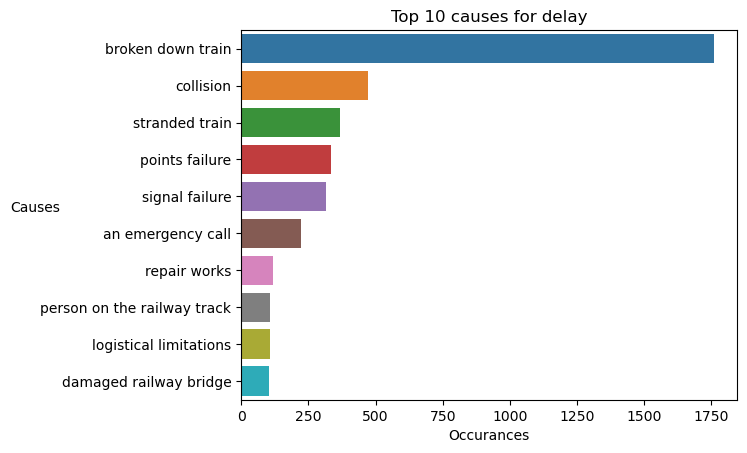

In [31]:
# Top 10 causes for delay are set with the corresponding amount of occurances
counts  = data2['statistical_cause_en'].value_counts()

# The amount of routes in top can be varied by replacing '10'
counts = counts[:10,]

# Assigning the axes to correct variables
sns.barplot(x=counts.values, y=counts.index)

# Setting title for plot
plt.title('Top 10 causes for delay')

# Setting the x-axis label
plt.xlabel('Occurances')

# Setting the y-axis label
plt.ylabel('Causes',rotation='horizontal')

# Ploting the bar graph
plt.show()

The diagram below is a visualization of the dataframe in 3.1 with the highest total impact.

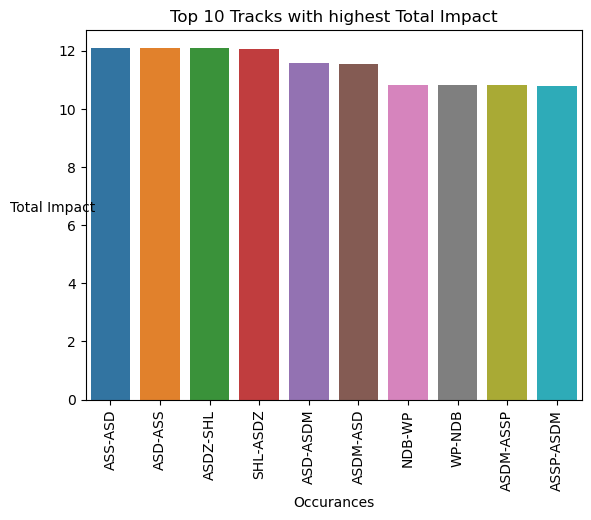

In [32]:

r2 = df_merged.sort_values('TotalImpact',ascending=False)

r2["Track"] = r2['UserStopCodeBegin'] + '-' + r2['UserStopCodeEnd']
r3 = r2.head(10)
r3

sns.barplot(x=r3['Track'], y=r3['TotalImpact'])

# Setting title for plot
plt.title('Top 10 Tracks with highest Total Impact')

# Setting the x-axis label
plt.xlabel('Occurances')

plt.xticks(rotation='vertical')

# Setting the y-axis label
plt.ylabel('Total Impact',rotation='horizontal')

# Ploting the bar graph
plt.show()

#### 3.2.2 Total impact map

##### Map 1

The map below is created with plotly.express mapbox. The size of the dots is related to the average number of passengers boarding or deboarding at the station (so the busier the station, the bigger the dot). We intended to give the lines, representing the track, a colour, depending on the total impact (green low impact, red high impact), but we did not manage to make it work in plotly.express mapbox.

As an alternative we plotted the data with the .plot() command, which worked well, but unfortunatly is without a map as background.

In [33]:
# Adding values to the stations and tracks when hovering

lats = []
lons = []
traces = []
codes = []
lengths = []
segments = []

for feature, trace, code, length, segment in zip(sporen.geometry, sporen["kmlint_omschrijving"], sporen["kmlint"], sporen.lengte, sporen['geocode_naam']):
    if isinstance(feature, shapely.geometry.linestring.LineString):
        linestrings = [feature]
    elif isinstance(feature, shapely.geometry.multilinestring.MultiLineString):
        linestrings = feature.geoms
    else:
        continue
    for linestring in linestrings:
        x, y = linestring.xy
        lats = np.append(lats, y)
        lons = np.append(lons, x)
        traces = np.append(traces, [trace]*len(y))
        codes = np.append(codes, [code]*len(y))
        lengths = np.append(lengths, [length]*len(y))
        segments = np.append(segments, [segment]*len(y))
        
        lats = np.append(lats, None)
        lons = np.append(lons, None)
        traces = np.append(traces, None)
        codes = np.append(codes, None)
        lengths = np.append(lengths, None)
        segments = np.append(segments, None)
        
sett = {'lat': lats, 'lon': lons, 'trace': traces, 'code': codes, 'length': lengths, 'segment': segments}

In [35]:
# plotting the map of tracks and stations

fig = px.scatter_mapbox(stations, lat="geo_lat", lon="geo_lng", size="BDB_Filtered", color_continuous_scale=[], color="Maatschappij", size_max=15, hover_name="name_long", hover_data=["code", stations.index, "type", "Maatschappij", "BoardingDeboarding"], zoom=6.7, width=800, height=700)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(coloraxis_showscale=False)

fig2 = px.line_mapbox(data_frame=sett, lat='lat', lon='lon', hover_name='trace', hover_data=['code', 'segment'],
                     mapbox_style="carto-positron", zoom=1, title='Map 1')
fig.add_trace(fig2.data[0])

fig.show()

##### Map 2

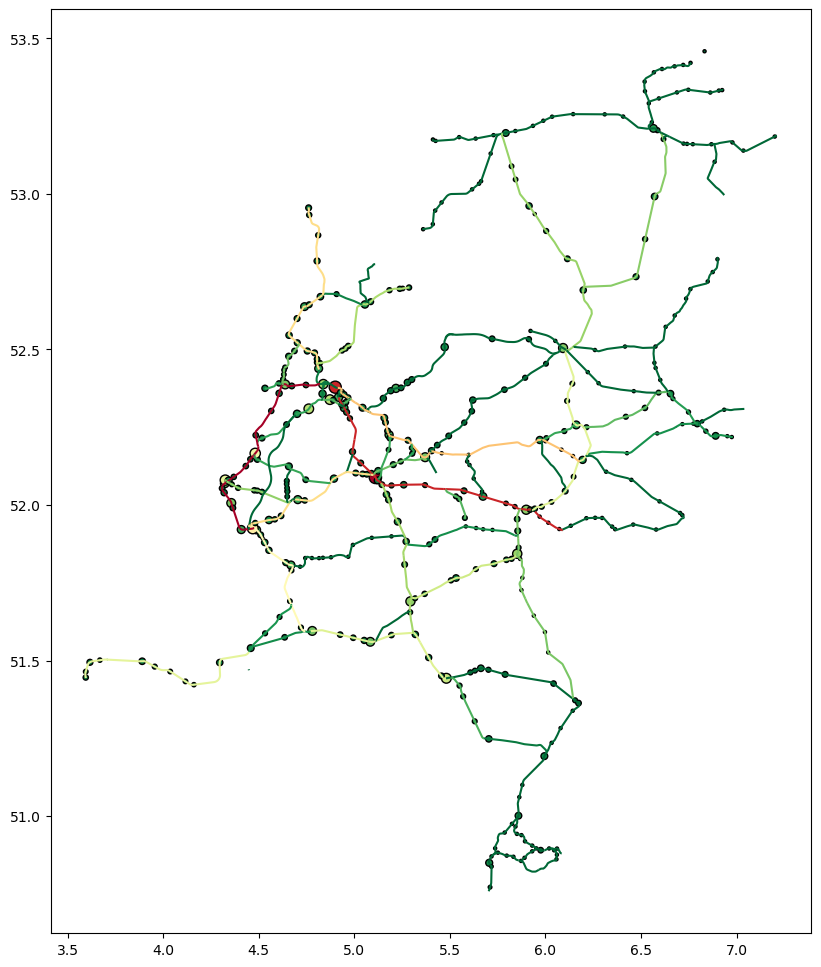

In [36]:
# Alternative map with colored tracks and stations 

fig, ax = plt.subplots(figsize=(10,12))
plt.scatter(stations["geo_lng"], stations["geo_lat"], edgecolor='black', c=stations["BoardingDeboarding"], cmap='RdYlGn_r', marker='.', s=stations["BDB_Filtered"])
sporen.plot(ax=ax, cmap='RdYlGn_r', column='delay_value')

plt.show()

### 3.3 Conclusion

The goal of this report is to give an answer to the question:

*‘By what disruptions and on what train trajectories are the most people affected, and how can the impact of these postponements be minimized?’*

To do so we looked at the main causes of the delay, the amount of delays on the tracks, and the amount of passengers affected by the cancellations. For the amount of delays and amount of passengers affected by the delays we’ve produced a new value named ‘total impact’ that includes the two values. The tracks with the highest impact are especially around Amsterdam. This is mostly because of the high total of passengers that need to be transported around Amsterdam on a daily basis. Because of this it is logical that the delays that happen around these tracks immediately have a very high impact. The amount of delays around the tracks don’t score very high relatively. 

Most common cause of delays are because of broken down trains. Broken down trains can cause delays because of defects in essential parts of trains or the absence of certain parts. To lessen the amount of delays for the tracks with the highest impact, better maintenance of the trains could be the solution. This does come with extra costs for the NS. It is up to them to decide if they are willing to spend more money on these activities. 

Stranded train is also a common cause of delay and scores highest on the track between Amsterdam Zuid and Amsterdam Sloterdijk. According to rijdendetreinen, stranded trains can happen because of trains driving through a red light or defect overhead wires. This cause of delay can be considered location specific. If this cause appears to happen a lot on a certain track, and in this case just before, after or between Amsterdam Zuid and Amsterdam Sloterdijk, it is pretty clear to say that something could be wrong with the track. 

For follow-up research it could be interesting to look at the amount of train delays because of broken down trains per traintype. The trains that are causing many delays because of this, can be thought of to be removed. The NS could also do further research on what goes wrong on the tracks with many stranded trains. If many trains drive through a red light on the track, it could be fixed by implementing more warning signs.  


# References

The location of the used datasets can be found here:

https://www.rijdendetreinen.nl/over/open-data
- disruptions-2021.csv
- stations-2022-01-nl.csv
 

https://data.ovdata.nl/ftp/data.ndovloket.nl/bezetting/ns/
- C:/Users/joost/Downloads/Finalreport/Alldays


https://dashboards.nsjaarverslag.nl/api/dashboard/0
- henk_data.json


https://www.nationaalgeoregister.nl/geonetwork/srv/dut/catalog.search#/metadata/2768fd98-3d2a-4790-886c-7435fc0ad4f6
- trajecten.json




# Appendix

### Appendix A: NS trains

**ICM:**

0:  mBk + AB + sBk
1/2: mBFk + AB + sBk
3/4: mBFk + mB + A + sBk

0: 205
1: 225
2: 226
3: 300
4: 301

The ICM’s with 3 sets model 1/2 contain a seat capacity of around 225. 3/4 with 4 sets has a seat capacity of around 300. This would say that a set has a capacity of around 75. 

https://nl.wikipedia.org/wiki/Intercitymaterieel



**VIRM:**  double decker

III: 288
IV: 387-410 / 4021
VI: 593-600

Gives the amount of train sets. This would say that each train set has a capacity of around 100 each. 


**SW7-25KV:**

No data could be found, but this train type is similair to the ICM. So the same amount of seats has been used for this type: 75


**SW9-25KV:**

No data could be found, but this train type is similair to the ICM. So the same amount of seats has been used for this type: 75

**DDZ:**

4: ABvk-Bv1-ABv-mBk
6: ABvk-Bv1-ABv-Bv2-ABv-mBk

4 bakken: 373
6 bakken: 607

Around 100 per train set

https://nl.wikipedia.org/wiki/Dubbeldekker_Zonering 

**SNG:**

https://nl.wikipedia.org/wiki/Sprinter_Nieuwe_Generatie

3: mABk+B1+mBk
4: mABk+B1+B2+mABk

3: 148
4: 200
Around 50 per train set. 

**SLT:**

4: Bo' Bo' 2' 2' Bo'
6: Bo' Bo' 2' 2' 2' Bo' Bo'

4: 216 - 2042
6: 342 - 3302

Around 50 per train set. 

https://nl.wikipedia.org/wiki/Sprinter_Lighttrain


**FLIRT FFF:**

Flirt III: mABk + B1 + mABk
Flirt IV: mABk + B1 + B2 + mABk

Flirt III: 158
Flirt IV: 214

Around 50 per train set 

https://nl.wikipedia.org/wiki/NS_FLIRT


**SGMM:**

ABk + Bk (1+2)
Bk + AB + Bk (3+4)

142 (1+2)
222 (3+4)

Around 75 per train set 

https://nl.wikipedia.org/wiki/Stadsgewestelijk_Materieel

**FLIRT TAG:**

Seats: 103

Amount of sets: 2

Around 50 per train set. 

https://nl.wikipedia.org/wiki/NS_R-net_FLIRT


### Appendix B: NS Forum

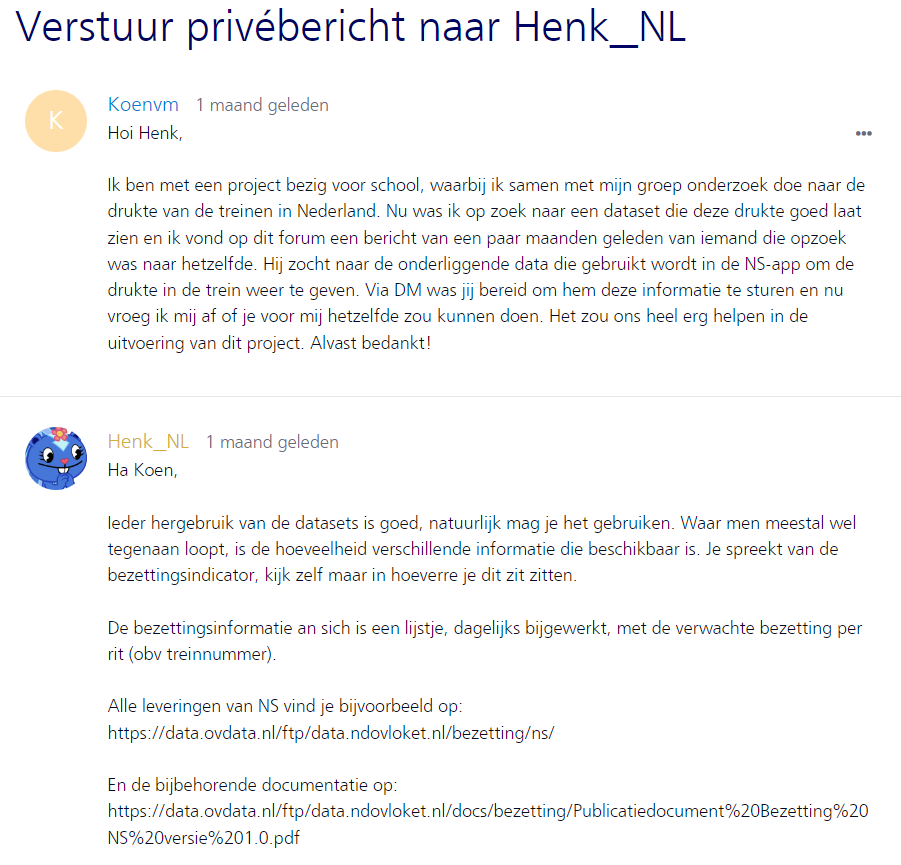

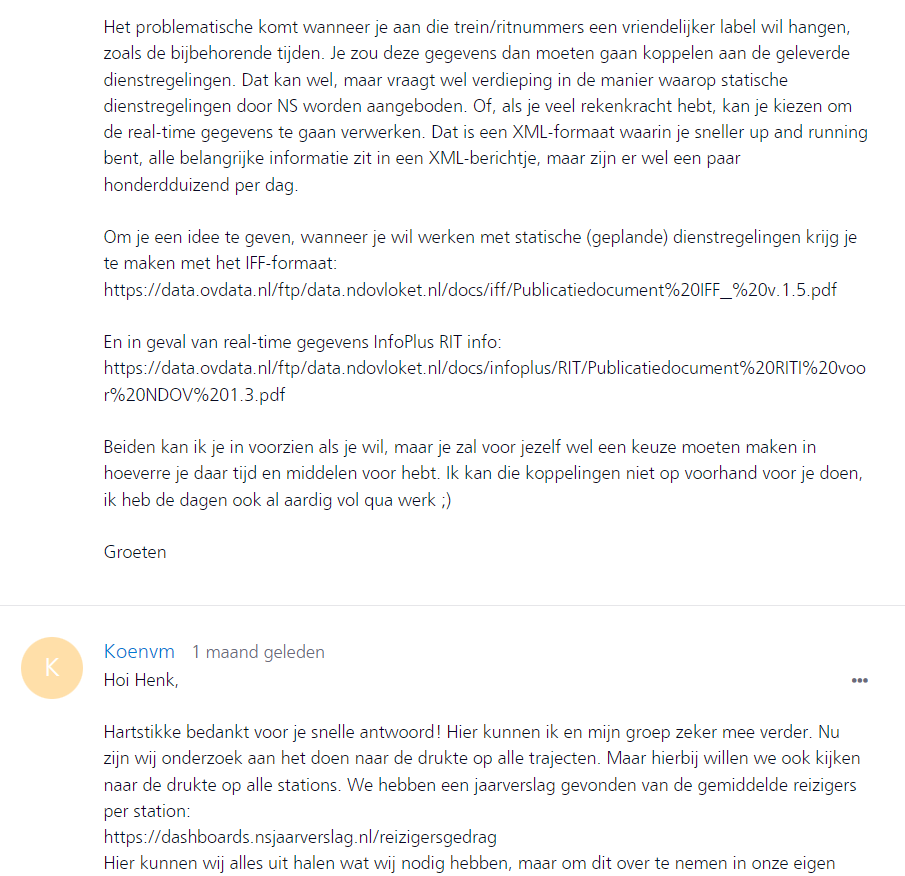

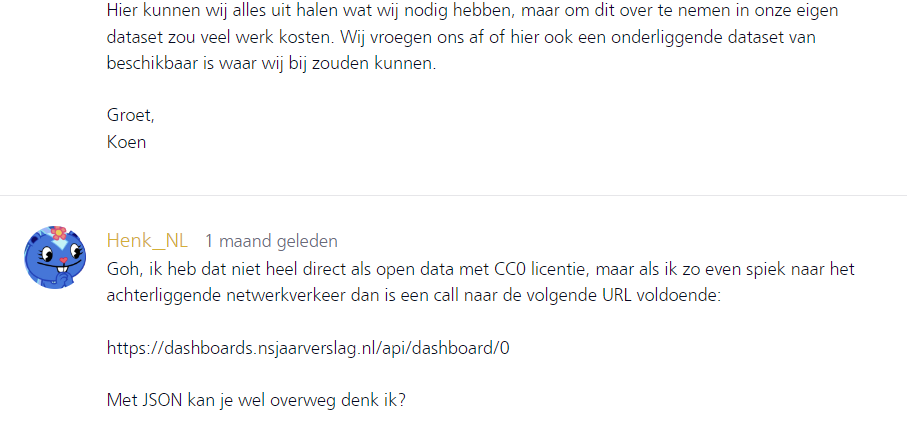